<a href="https://colab.research.google.com/github/SohamBodhak/ML_notebooks/blob/main/Rainfall_in_WB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing the required libraries

In [ ]:
import sys
print(sys.version)  #it prints the version of python kernel currently the program is being interpreted on

3.10.12 (main, Nov  6 2024, 20:22:13) [GCC 11.4.0]


In [ ]:
#importing the necessary modules and librarises
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
#to show the matplotlib plots directly within the notebook without using different windows
%matplotlib inline

In [ ]:
df = pd.read_csv("rainfall in india 1901-2015.csv")   #loading the data about rainfall in different subregion in india in different years
df.head()   #showing initial five lines of the data

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,ANDAMAN & NICOBAR ISLANDS,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,ANDAMAN & NICOBAR ISLANDS,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,ANDAMAN & NICOBAR ISLANDS,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,ANDAMAN & NICOBAR ISLANDS,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8


## Data Exploration and Pre-Processing

In [ ]:
df.info()  #showing information about the dataframe

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4116 entries, 0 to 4115
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SUBDIVISION  4116 non-null   object 
 1   YEAR         4116 non-null   int64  
 2   JAN          4112 non-null   float64
 3   FEB          4113 non-null   float64
 4   MAR          4110 non-null   float64
 5   APR          4112 non-null   float64
 6   MAY          4113 non-null   float64
 7   JUN          4111 non-null   float64
 8   JUL          4109 non-null   float64
 9   AUG          4112 non-null   float64
 10  SEP          4110 non-null   float64
 11  OCT          4109 non-null   float64
 12  NOV          4105 non-null   float64
 13  DEC          4106 non-null   float64
 14  ANNUAL       4090 non-null   float64
 15  Jan-Feb      4110 non-null   float64
 16  Mar-May      4107 non-null   float64
 17  Jun-Sep      4106 non-null   float64
 18  Oct-Dec      4103 non-null   float64
dtypes: flo

In [ ]:
df.describe()  #showing statistical parameters of each columns in the dataframe

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
count,4116.000000,4112.000000,4113.000000,4110.000000,4112.000000,4113.000000,4111.000000,4109.000000,4112.000000,4110.000000,4109.000000,4105.000000,4106.000000,4090.000000,4110.000000,4107.000000,4106.000000,4103.000000
mean,1958.218659,18.957320,21.805325,27.359197,43.127432,85.745417,230.234444,347.214334,290.263497,197.361922,95.507009,39.866163,18.870580,1411.008900,40.747786,155.901753,1064.724769,154.100487
std,33.140898,33.585371,35.909488,46.959424,67.831168,123.234904,234.710758,269.539667,188.770477,135.408345,99.519134,68.685410,42.369611,903.846565,59.308277,201.316965,707.741531,166.942660
min,1901.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,62.300000,0.000000,0.000000,57.400000,0.000000
25%,1930.000000,0.600000,0.600000,1.000000,3.000000,8.600000,70.350000,175.600000,155.975000,100.525000,14.600000,0.700000,0.100000,804.500000,4.100000,24.050000,573.850000,34.200000
50%,1958.000000,6.000000,6.700000,7.800000,15.700000,36.600000,138.700000,284.800000,259.400000,173.900000,65.200000,9.500000,3.000000,1121.300000,19.200000,74.800000,881.100000,98.200000
75%,1987.000000,22.200000,26.800000,31.300000,49.950000,97.200000,305.150000,418.400000,377.800000,265.800000,148.400000,46.100000,17.500000,1644.775000,50.375000,196.950000,1288.175000,213.500000
max,2015.000000,583.700000,403.500000,605.600000,595.100000,1168.600000,1609.900000,2362.800000,1664.600000,1222.000000,948.300000,648.900000,617.500000,6331.100000,699.500000,1745.800000,4536.900000,1252.500000


In [ ]:
df.isnull().sum()  #finding null datas in every column and then summing up the numbers null values

,0
SUBDIVISION,0
YEAR,0
JAN,4
FEB,3
MAR,6
APR,4
MAY,3
JUN,5
JUL,7
AUG,4


In [ ]:
df.duplicated().sum()  #returns the number of rows whcih is repeated more than once in the data

0

In [ ]:
df['SUBDIVISION'].value_counts()  #returns number of values under each row

,count
SUBDIVISION,
WEST MADHYA PRADESH,115
EAST RAJASTHAN,115
COASTAL KARNATAKA,115
TAMIL NADU,115
RAYALSEEMA,115
TELANGANA,115
COASTAL ANDHRA PRADESH,115
CHHATTISGARH,115
VIDARBHA,115


In [ ]:
df.mean(axis=0,numeric_only=True)  #return the means of rainfall in every subregion in every month

,0
YEAR,1958.218659
JAN,18.957320
FEB,21.805325
MAR,27.359197
APR,43.127432
MAY,85.745417
JUN,230.234444
JUL,347.214334
AUG,290.263497
SEP,197.361922


In [ ]:
df = df.fillna(df.mean(numeric_only=True))  #filling null values with mean

In [ ]:
df.head(25)  #showing initial 25 lines of dataframe

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,49.2,87.1,29.200000,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.60000,3373.2000,136.3,560.300000,1696.3,980.300000
1,ANDAMAN & NICOBAR ISLANDS,1902,0.0,159.8,12.200000,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.50000,3520.7000,159.8,458.300000,2185.9,716.700000
2,ANDAMAN & NICOBAR ISLANDS,1903,12.7,144.0,0.000000,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.00000,2957.4000,156.7,236.100000,1874.0,690.600000
3,ANDAMAN & NICOBAR ISLANDS,1904,9.4,14.7,0.000000,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.10000,3079.6000,24.1,506.900000,1977.6,571.000000
4,ANDAMAN & NICOBAR ISLANDS,1905,1.3,0.0,3.300000,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.70000,2566.7000,1.3,309.700000,1624.9,630.800000
5,ANDAMAN & NICOBAR ISLANDS,1906,36.6,0.0,0.000000,0.0,556.1,733.3,247.7,320.5,164.3,267.8,128.9,79.20000,2534.4000,36.6,556.100000,1465.8,475.900000
6,ANDAMAN & NICOBAR ISLANDS,1907,110.7,0.0,113.300000,21.6,616.3,305.2,443.9,377.6,200.4,264.4,648.9,245.60000,3347.9000,110.7,751.200000,1327.1,1158.900000
7,ANDAMAN & NICOBAR ISLANDS,1908,20.9,85.1,0.000000,29.0,562.0,693.6,481.4,699.9,428.8,170.7,208.1,196.90000,3576.4000,106.0,591.000000,2303.7,575.700000
8,ANDAMAN & NICOBAR ISLANDS,1910,26.6,22.7,206.300000,89.3,224.5,472.7,264.3,337.4,626.6,208.2,267.3,153.50000,2899.4000,49.3,520.100000,1701.0,629.000000
9,ANDAMAN & NICOBAR ISLANDS,1911,0.0,8.4,0.000000,122.5,327.3,649.0,253.0,187.1,464.5,333.8,94.5,247.10000,2687.2000,8.4,449.800000,1553.6,675.400000


In [ ]:
df.isnull().any()  #checking for null values

,0
SUBDIVISION,False
YEAR,False
JAN,False
FEB,False
MAR,False
APR,False
MAY,False
JUN,False
JUL,False
AUG,False


In [ ]:
df.YEAR.unique()  #checking for any repeated year in the dataframe

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1910, 1911, 1912,
       1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923,
       1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934,
       1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1946, 1947, 1949,
       1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960,
       1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       1943, 1944, 1945, 1948, 1909])

In [ ]:
df.shape  #returns the shape

(4116, 19)

## Data Visualization

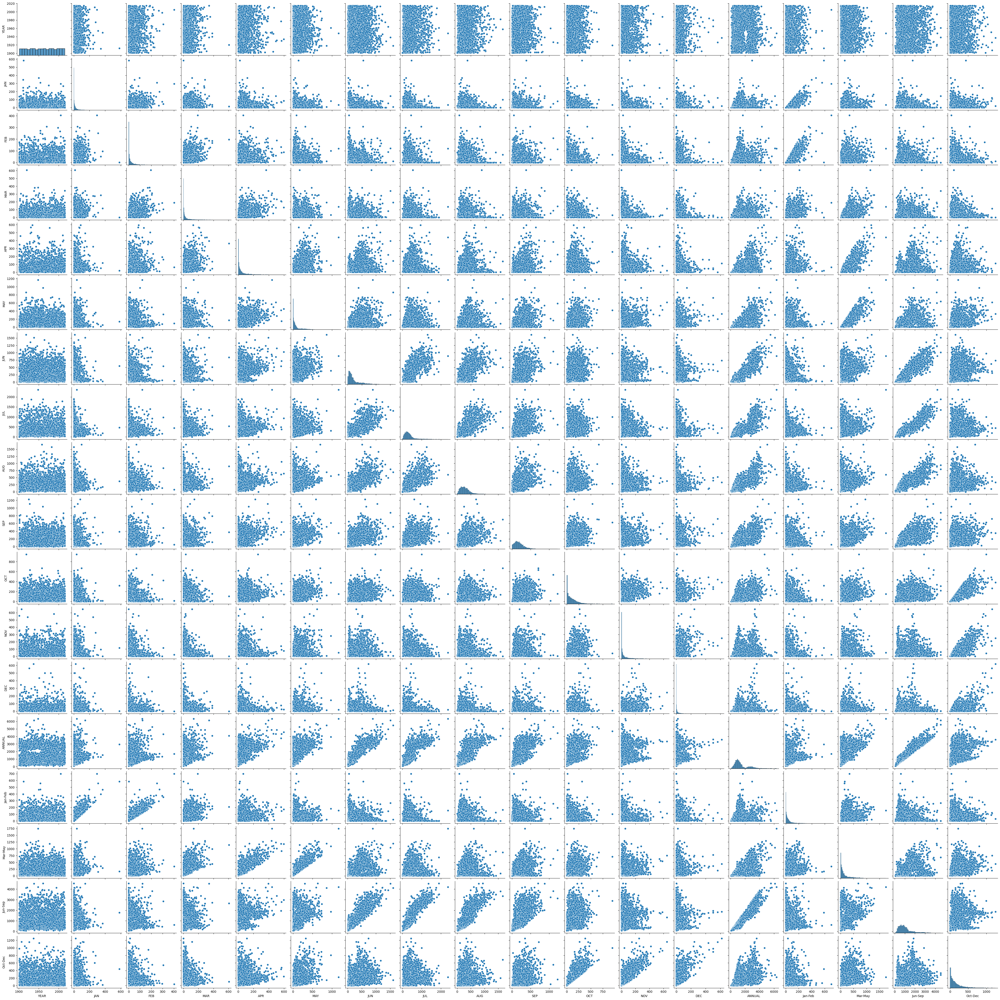

In [ ]:
sns.pairplot(df)  #pair-wise plot

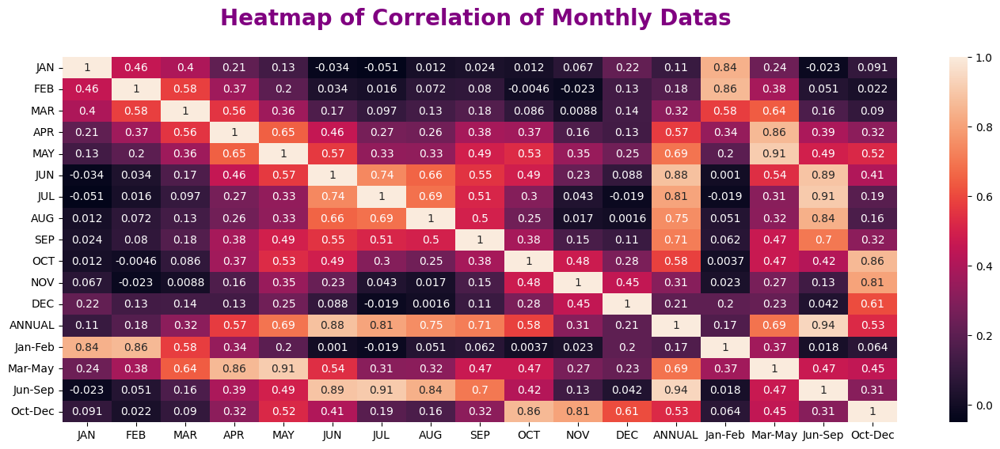

In [ ]:
#plotting heatmap of correlation between datas of every months
plt.figure(figsize=(17,6))
numeric_df = df.iloc[:,2:]
sns.heatmap(numeric_df.corr(),annot=True)
plt.title("Heatmap of Correlation of Monthly Datas \n", fontsize=20,fontweight='bold', color='purple')
plt.show()

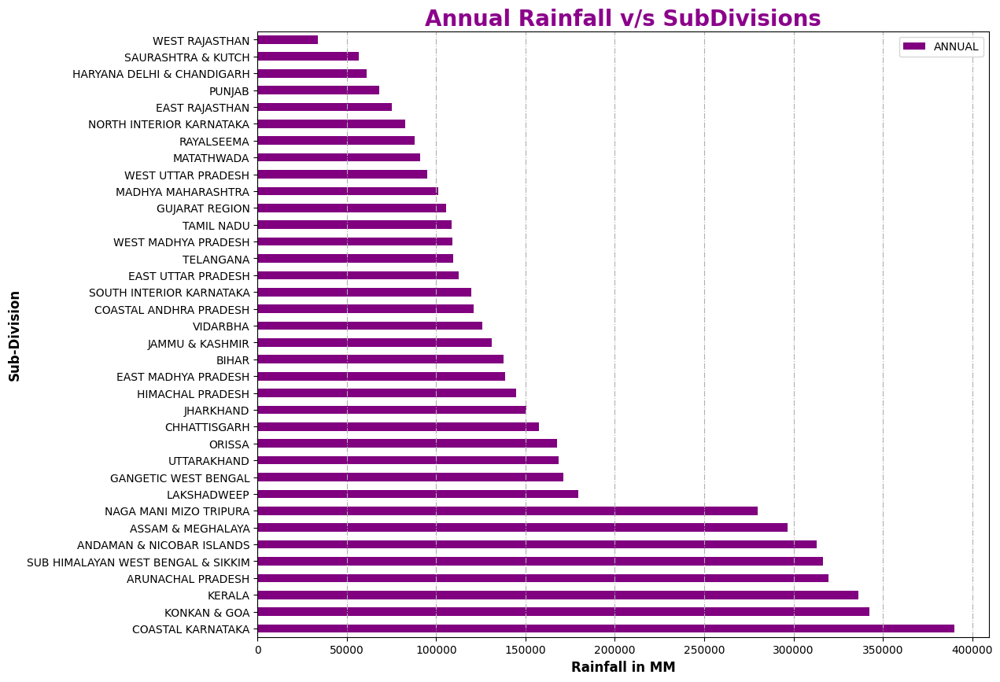

In [ ]:
#horizontal bar plot of annual rainfall data in subregions
df[["SUBDIVISION","ANNUAL"]].groupby("SUBDIVISION").sum().sort_values(by='ANNUAL',ascending=False).plot(kind='barh',stacked=True,figsize=(12,10),color="purple")
plt.xlabel("Rainfall in MM",fontweight='bold',size=12)
plt.ylabel("Sub-Division",size=12,fontweight='bold')
plt.title("Annual Rainfall v/s SubDivisions",fontweight='bold',fontsize=20,color='darkmagenta')
plt.grid(axis="x",linestyle="-.")
plt.show()

From the plot above we can clearly see that in india some regions are specifically prone to heave rainfall than others based on their geographic location and other factors. Among all coastal karnataka has the most amount of rainfall annually and west rajasthan has the least. The subdivision which is going to be of our interest later in this project, Sum himalayan west bengal & sikkim is also one of the prone zones......

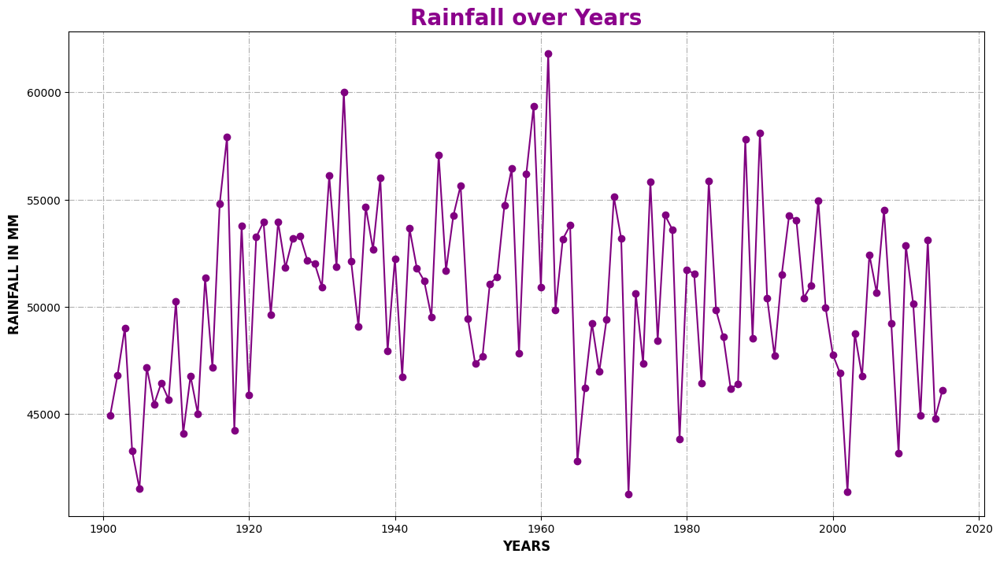

In [ ]:
#plotting annual rainfall vs the years
plt.figure(figsize=(15,8))
df.groupby("YEAR").sum()['ANNUAL'].plot(kind="line",color="purple",marker='o')
plt.xlabel("YEARS",size=12,fontweight='bold')
plt.ylabel("RAINFALL IN MM",size=12,fontweight='bold')
plt.grid(axis="both",linestyle="-.")
plt.title("Rainfall over Years",fontsize=20,fontweight='bold',color='darkmagenta')
plt.show()

This plot tells a lot about the patern and changes of annual rainfall in india over the years since 1900. From 1960 to 1980 we have the highest as well as the lowest of all time. Overall there is an arch like pattern can be seen.....

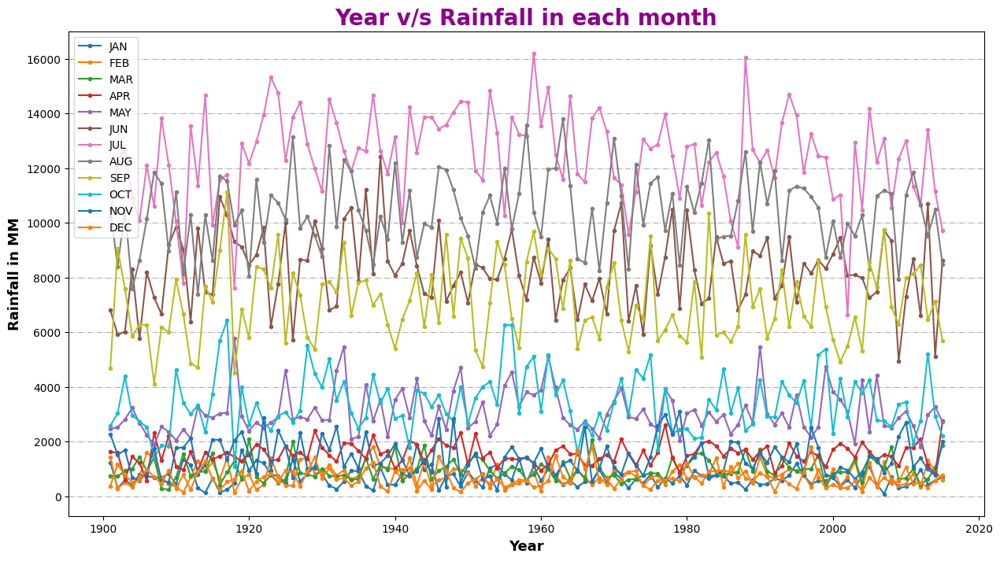

In [ ]:
#plotting the rainfall data of each month vs years
df[['YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL','AUG', 'SEP',
      'OCT', 'NOV', 'DEC']].groupby("YEAR").sum().plot(kind="line",figsize=(15,8),marker='.')
plt.xlabel("Year",size=13,fontweight='bold')
plt.ylabel("Rainfall in MM",size=13,fontweight='bold')
plt.title("Year v/s Rainfall in each month",fontweight='bold',size=20,color='darkmagenta')
plt.grid(axis="y",linestyle="-.")
plt.show()

Though it looks gibberish but upon close observation it can be seen that the arch like pattern in the previous graph can be observed here as well only for those months when the rainfall is high , rest of the months do not contribute in the pattern as much.....

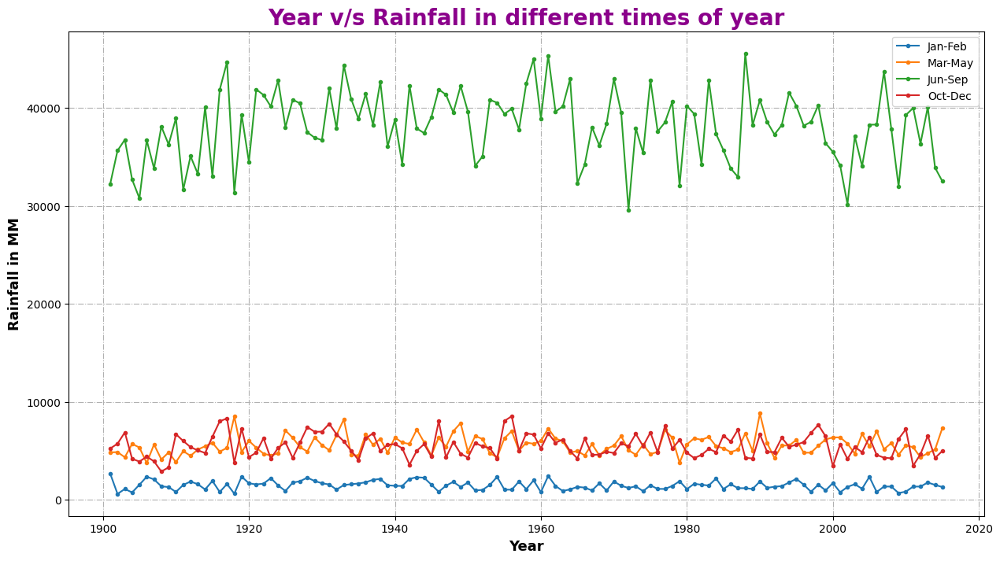

In [ ]:
#plotting rainfall in different times of the years vs years
df[['YEAR', 'Jan-Feb', 'Mar-May', 'Jun-Sep', 'Oct-Dec']].groupby("YEAR").sum().plot(kind="line",figsize=(15,8),marker='.')
plt.xlabel("Year",size=13,fontweight='bold')
plt.ylabel("Rainfall in MM",size=13,fontweight='bold')
plt.title("Year v/s Rainfall in different times of year",fontweight='bold',size=20,color='darkmagenta')
plt.grid(axis="both",linestyle="-.")
plt.show()

Same goes for these graph as well , Jun-Sep is the time when the effective rainfall happens.....

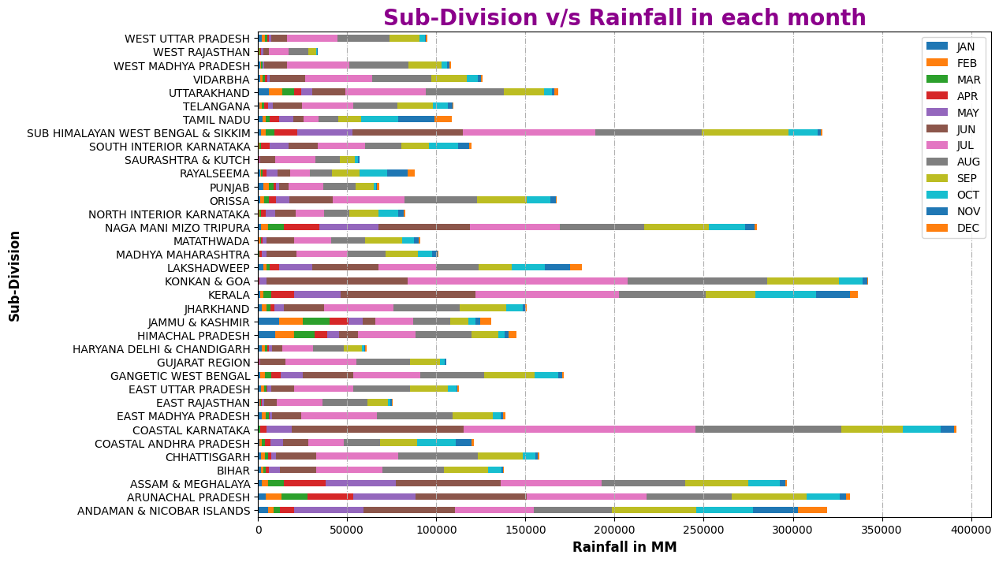

In [ ]:
#barplot of rainfall in each subdivision in every months
df[['SUBDIVISION', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("SUBDIVISION").sum().plot(kind="barh",stacked=True,figsize=(12,8))
plt.title("Sub-Division v/s Rainfall in each month",fontweight='bold',size=20,color='darkmagenta')
plt.xlabel("Rainfall in MM",size=12,fontweight='bold')
plt.ylabel("Sub-Division",size=12,fontweight='bold')
plt.grid(axis="x",linestyle="-.")
plt.show()

A beautiful visual representation of month wise color-coded barplot of all subdivisions in india ......

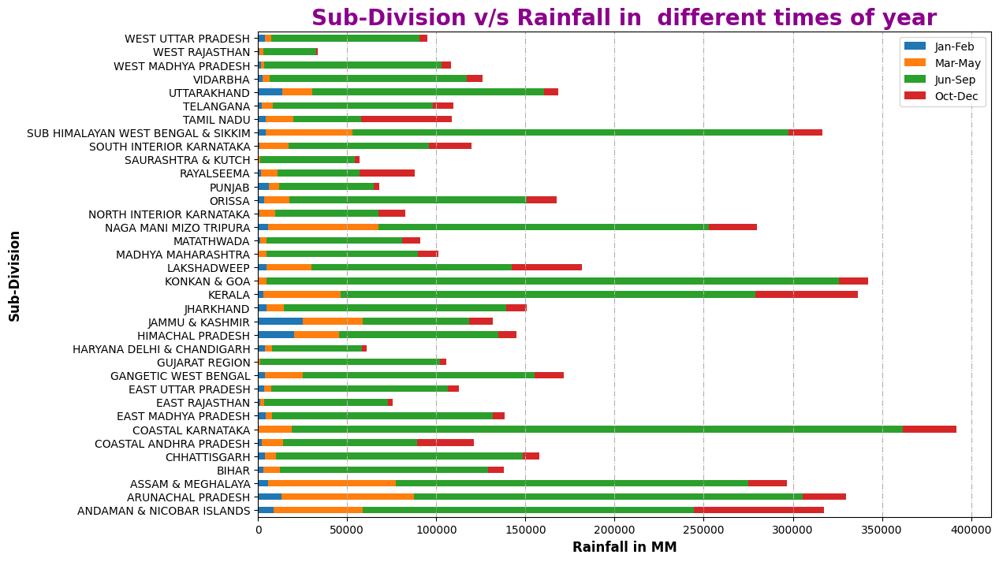

In [ ]:
#barplot of rainfall in every subdivisions in different times of the year
df[['SUBDIVISION', 'Jan-Feb', 'Mar-May', 'Jun-Sep', 'Oct-Dec']].groupby("SUBDIVISION").sum().plot(kind="barh",stacked=True,figsize=(12,8))
plt.title("Sub-Division v/s Rainfall in  different times of year",fontweight='bold',size=20,color='darkmagenta')
plt.xlabel("Rainfall in MM",size=12,fontweight='bold')
plt.ylabel("Sub-Division",size=12,fontweight='bold')
plt.grid(axis="x",linestyle="-.")
plt.show()

Barplot for rainfall in all the subdivisions for different times of the year....

### Analysis of rainfall data of SUB HIMALAYAN WEST BENGAL & SIKKIM

Now we are choosing a particular subregion for analysis and model training to further predict the rainfall pattern in subsequent years in that region , which is in this case Sub Himalayan Wes Bengal & sikkim. From this we shall get an idea about how the rainfall is chainging with time in this region. Let's start......

In [ ]:
#choosing the subdivision of our interest from the actual dataset.....
WB = df.loc[((df['SUBDIVISION'] == 'SUB HIMALAYAN WEST BENGAL & SIKKIM'))]
WB.head(5)

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
437,SUB HIMALAYAN WEST BENGAL & SIKKIM,1901,26.5,14.8,14.1,29.2,195.5,488.4,524.8,501.1,242.7,55.5,17.9,2.6,2113.2,41.3,238.9,1757.0,76.1
438,SUB HIMALAYAN WEST BENGAL & SIKKIM,1902,1.2,0.7,87.1,126.1,271.3,539.2,671.0,603.8,799.9,74.4,5.6,0.0,3180.4,1.9,484.6,2613.9,80.1
439,SUB HIMALAYAN WEST BENGAL & SIKKIM,1903,5.5,8.7,19.6,18.6,163.6,541.2,431.5,708.8,365.2,141.3,0.3,0.0,2404.5,14.3,201.9,2046.7,141.6
440,SUB HIMALAYAN WEST BENGAL & SIKKIM,1904,3.4,29.2,0.9,124.3,333.6,274.2,500.4,468.5,260.6,164.8,8.9,1.1,2169.9,32.5,458.8,1503.7,174.8
441,SUB HIMALAYAN WEST BENGAL & SIKKIM,1905,12.0,31.2,51.9,104.4,290.6,524.8,523.1,1036.6,321.1,87.9,2.7,18.7,3005.0,43.2,447.0,2405.6,109.3


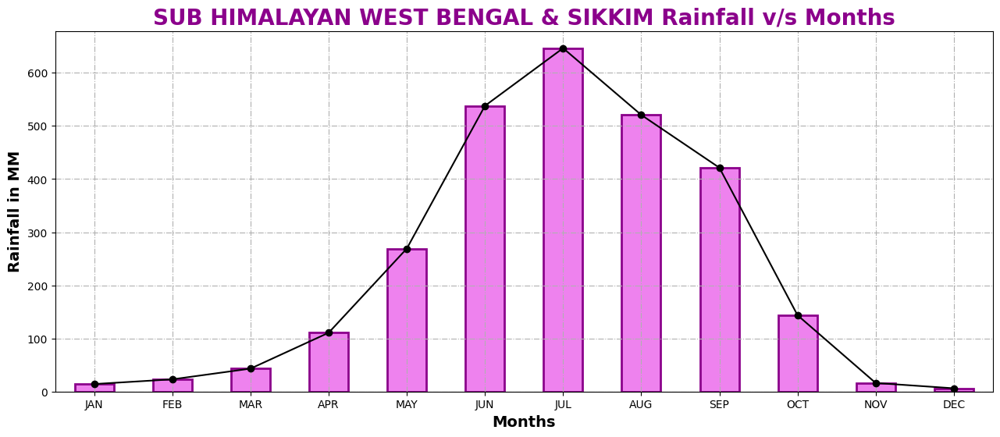

In [ ]:
#plotting the monthly average rainfall vs months graph
plt.figure(figsize=(15.5,6))
WB[['JAN', 'FEB', 'MAR', 'APR','MAY', 'JUN','JUL','AUG', 'SEP', 'OCT','NOV','DEC']].mean().plot(kind="bar",width=0.5,linewidth=2 ,edgecolor='darkmagenta', color='violet')
WB[['JAN', 'FEB', 'MAR', 'APR','MAY', 'JUN','JUL','AUG', 'SEP', 'OCT','NOV','DEC']].mean().plot(kind="line",marker='o' , color='black')
plt.title("SUB HIMALAYAN WEST BENGAL & SIKKIM Rainfall v/s Months",size=20 ,fontweight='bold',color='darkmagenta')
plt.xlabel("Months",size=14,fontweight='bold')
plt.ylabel("Rainfall in MM",size=14,fontweight='bold')
plt.grid(axis="both",linestyle="-.")
plt.show()

In this plot we can see that the average rainfall of each months takes maximum value in July. Another thing can be concluded that the graph is a bit negative skewed which portrays the fact that in the first half of the year in west bengal we mostly experience the heat of summer after may the rainy season begins generally......

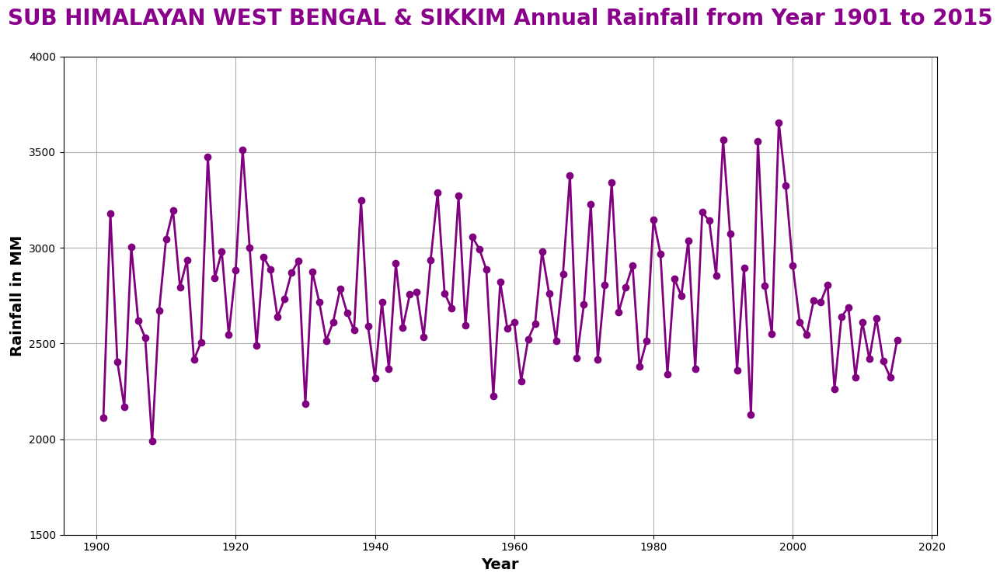

In [ ]:
#plotting annual rainfall vs years
WB.groupby("YEAR").sum()['ANNUAL'].plot(ylim=(1500,4000),color='purple',marker='o',linestyle='-',linewidth=2,figsize=(14.5,8));
plt.xlabel('Year',size=14,fontweight='bold')
plt.ylabel('Rainfall in MM',size=14,fontweight='bold')
plt.title('SUB HIMALAYAN WEST BENGAL & SIKKIM Annual Rainfall from Year 1901 to 2015\n',size=20,fontweight='bold',color='darkmagenta')
plt.grid()
plt.show()

From the above plot we can see the rainfall trend in west bengal over the years. It looks pretty impredictable though but there is some kind of trend or pattern in it, our aim is to train our chosen model on this data to fit this trend and make prediction about future rainfall in subsequent years.....

## Data Preprocessing & Modelling

In [ ]:
#checking the number of unique entries in the subdivision column
df["SUBDIVISION"].nunique()

36

In [ ]:
#grouping based on the subdivision in the dataset and extracting our regon of interest
group = df.groupby('SUBDIVISION')[['YEAR','JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']]
df = group.get_group('SUB HIMALAYAN WEST BENGAL & SIKKIM')
df.head()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
437,1901,26.5,14.8,14.1,29.2,195.5,488.4,524.8,501.1,242.7,55.5,17.9,2.6
438,1902,1.2,0.7,87.1,126.1,271.3,539.2,671.0,603.8,799.9,74.4,5.6,0.0
439,1903,5.5,8.7,19.6,18.6,163.6,541.2,431.5,708.8,365.2,141.3,0.3,0.0
440,1904,3.4,29.2,0.9,124.3,333.6,274.2,500.4,468.5,260.6,164.8,8.9,1.1
441,1905,12.0,31.2,51.9,104.4,290.6,524.8,523.1,1036.6,321.1,87.9,2.7,18.7


In [ ]:
#reseting the index  and unpivotting the dataframe in terms of year for convenience
df2=df.melt(['YEAR']).reset_index()
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,26.5
1,1,1902,JAN,1.2
2,2,1903,JAN,5.5
3,3,1904,JAN,3.4
4,4,1905,JAN,12.0


In [ ]:
#sorting the dataframe based on the year and reseting the index again
df2= df2[['YEAR','variable','value']].reset_index().sort_values(by=['YEAR','index'])
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,26.5
115,115,1901,FEB,14.8
230,230,1901,MAR,14.1
345,345,1901,APR,29.2
460,460,1901,MAY,195.5


In [ ]:
#checking how many unique years are there
df2.YEAR.unique()

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911,
       1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922,
       1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933,
       1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944,
       1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
       1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988,
       1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015])

In [ ]:
#renaming the columns for ease of use
df2.columns=['Index','Year','Month','Avg_Rainfall']

In [ ]:
#printing
df2.head()

,Index,Year,Month,Avg_Rainfall
0,0,1901,JAN,26.5
115,115,1901,FEB,14.8
230,230,1901,MAR,14.1
345,345,1901,APR,29.2
460,460,1901,MAY,195.5


In [ ]:
#mapping the entries of the month column in the dataframe with numerical values from 1 to 12
Month_map={'JAN':1,'FEB':2,'MAR' :3,'APR':4,'MAY':5,'JUN':6,'JUL':7,'AUG':8,'SEP':9,
   'OCT':10,'NOV':11,'DEC':12}
df2['Month']=df2['Month'].map(Month_map)
df2.head(12)

,Index,Year,Month,Avg_Rainfall
0,0,1901,1,26.5
115,115,1901,2,14.8
230,230,1901,3,14.1
345,345,1901,4,29.2
460,460,1901,5,195.5
575,575,1901,6,488.4
690,690,1901,7,524.8
805,805,1901,8,501.1
920,920,1901,9,242.7
1035,1035,1901,10,55.5


In [ ]:
#droping columns of no use
df2.drop(columns="Index",inplace=True)

In [ ]:
#printing
df2.head(2)

,Year,Month,Avg_Rainfall
0,1901,1,26.5
115,1901,2,14.8


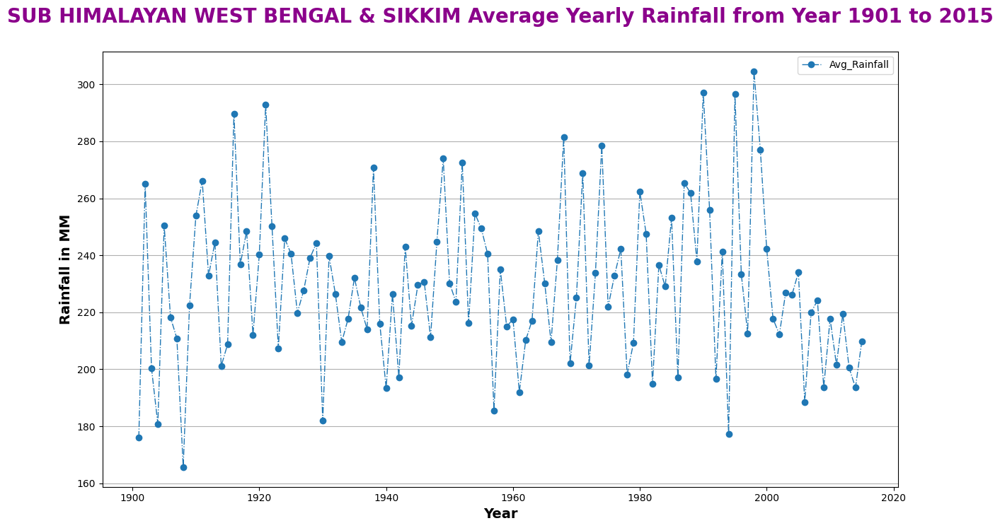

In [ ]:
#plotting yearly average rainfall from 1901 to 2015
df2.groupby("Year").mean().plot( kind='line',y='Avg_Rainfall',marker='o',linestyle='-.',linewidth=1,figsize=(14.5,8))
plt.title('SUB HIMALAYAN WEST BENGAL & SIKKIM Average Yearly Rainfall from Year 1901 to 2015\n',size=20,fontweight='bold',color='darkmagenta')
plt.xlabel('Year',size=14,fontweight='bold')
plt.ylabel('Rainfall in MM',size=14,fontweight='bold')
plt.grid(axis='y')
plt.show()

In [ ]:
#data processing
X=np.asanyarray(df2[['Year','Month']]).astype('int')
y=np.asanyarray(df2['Avg_Rainfall']).astype('int')

In [ ]:
X

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       ...,
       [2015,   10],
       [2015,   11],
       [2015,   12]])

In [ ]:
X[:15]

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       [1901,    4],
       [1901,    5],
       [1901,    6],
       [1901,    7],
       [1901,    8],
       [1901,    9],
       [1901,   10],
       [1901,   11],
       [1901,   12],
       [1902,    1],
       [1902,    2],
       [1902,    3]])

In [ ]:
y

array([26, 14, 14, ..., 53, 23,  9])

In [ ]:
#printing the shape of the features and variable
print(X.shape)
print(y.shape)

(1380, 2)
(1380,)


In [ ]:
# splitting the dataset into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [ ]:
X_train

array([[1959,    4],
       [1986,   10],
       [1993,    4],
       ...,
       [1944,   12],
       [1996,   10],
       [2008,    6]])

In [ ]:
y_train

array([111, 215, 136, ...,   0, 107, 526])

### ❏ Linear Regression Model

Let's try to fit the data with a linear model...

In [ ]:
#importing necessary modules and functions
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_train,y_train)

LinearRegression()

In [ ]:
# predicting
y_train_predict=LR.predict(X_train)
y_test_predict=LR.predict(X_test)

-------Test Data--------
MAE: 210.1545366942979
MSE: 61521.18334119328
RMSE: 248.0346414136406
Explained Variance Score: 0.010737662664486947 2

-------Train Data--------
MAE: 205.13772030115237
MSE: 59590.002304043046
RMSE: 244.11063537675503

-----Training Accuracy-------
2.3
-----Testing Accuracy--------
0.6


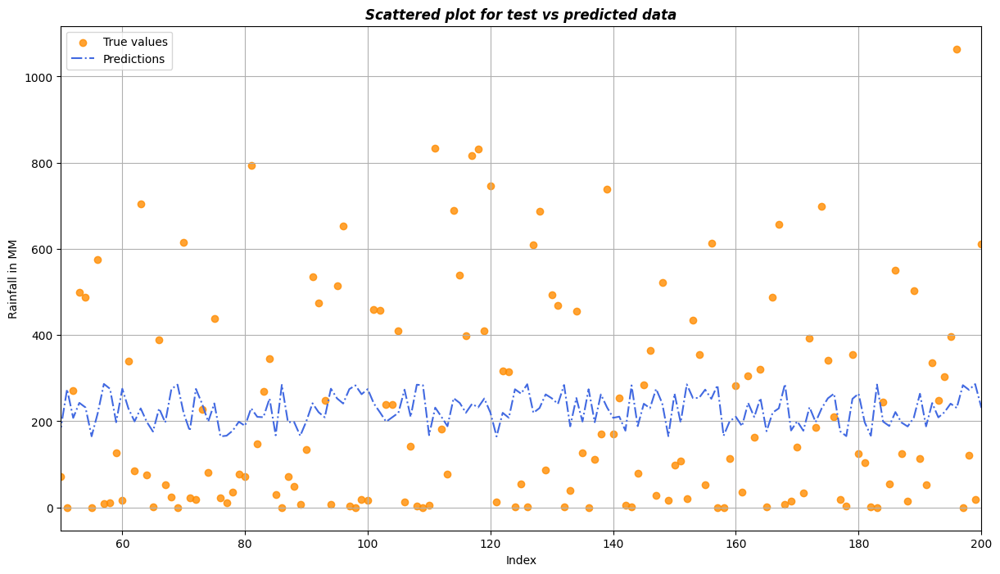

In [ ]:
#print the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))
print('Explained Variance Score:', metrics.explained_variance_score(y_test, y_test_predict),2)

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

print("\n-----Training Accuracy-------")
print(round(LR.score(X_train,y_train),3)*100)
print("-----Testing Accuracy--------")
print(round(LR.score(X_test,y_test),3)*100)
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


From the metrices above we can clearly see that linear regression model is of no use in case of our dataset as it can't justify the seasonal variation of rain by drawing just a straight line, so let's continue the quest for the best model.....

In [ ]:
predicted = LR.predict([[2014,2]])

In [ ]:
predicted

array([178.59389841])

### ❏ Polynomial Regression Model

Now let's bend the straight line a bit , let's see what happens....

In [ ]:
#importing necessary modules and functions
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import time

Polynomial Fit of Degree = 2
-------Test Data--------
MAE: 129.5031638794283
MSE: 25151.72702128791
RMSE: 158.59296018830062

-------Train Data--------
MAE: 126.91411265636845
MSE: 24765.300574677138
RMSE: 157.36994813075697

-----Training Accuracy-------
59.37100444346709
-----Testing Accuracy--------
59.40291052775686


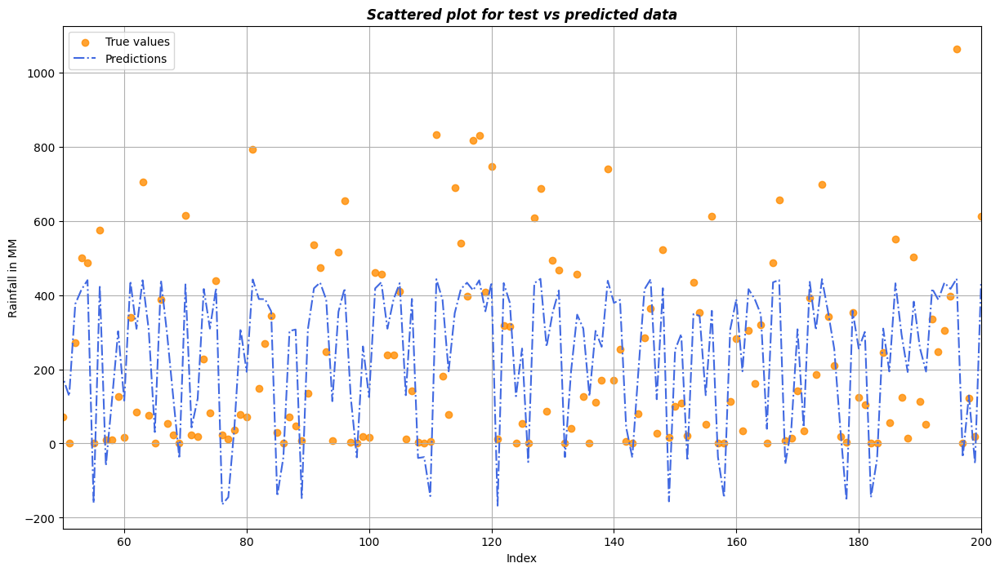

Polynomial Fit of Degree = 3
-------Test Data--------
MAE: 118.32833892729705
MSE: 20829.553976358664
RMSE: 144.32447462699687

-------Train Data--------
MAE: 113.87896026615299
MSE: 20867.895550767036
RMSE: 144.45724471540717

-----Training Accuracy-------
66.35285301745834
-----Testing Accuracy--------
65.79182149567113


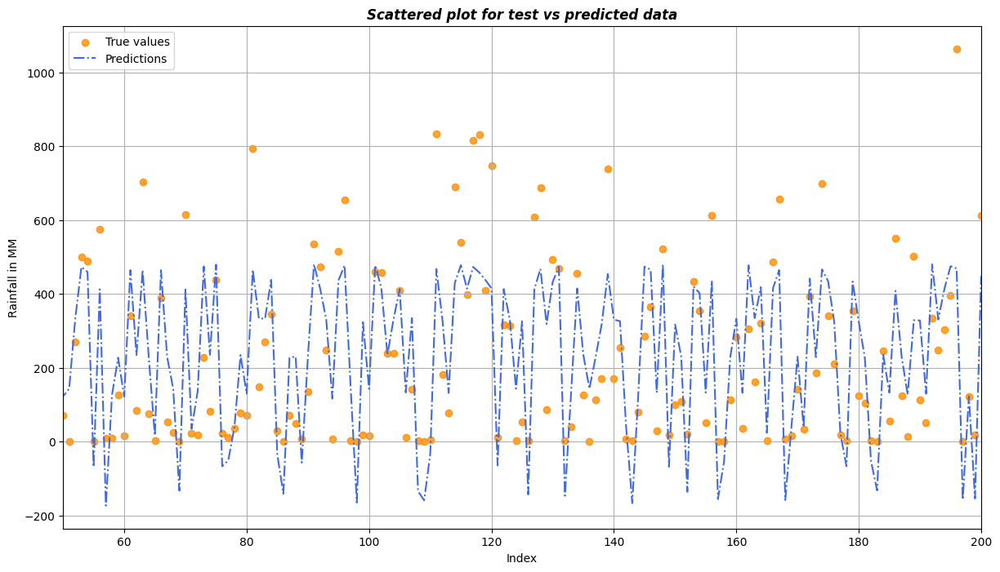

Polynomial Fit of Degree = 4
-------Test Data--------
MAE: 85.88852567394834
MSE: 12537.992360955286
RMSE: 111.97317697089463

-------Train Data--------
MAE: 82.4947448270795
MSE: 11827.368943705236
RMSE: 108.75370772394491

-----Training Accuracy-------
79.74667761422725
-----Testing Accuracy--------
80.61171299815364


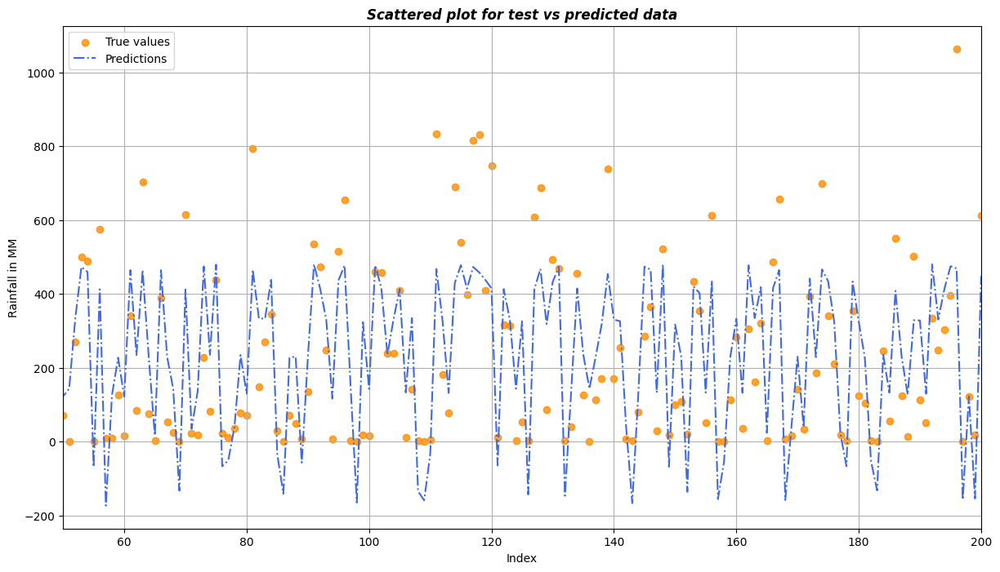

In [ ]:
# Define polynomial features
poly2=PolynomialFeatures(degree=2 , include_bias=False)
poly3=PolynomialFeatures(degree=3 , include_bias=False)
poly4=PolynomialFeatures(degree=4 , include_bias=False)


# Split the transformed data into training and test sets
X_train_poly_2 = poly2.fit_transform(X_train)
X_train_poly_3 = poly3.fit_transform(X_train)
X_train_poly_4 = poly4.fit_transform(X_train)
X_test_poly_2 = poly2.fit_transform(X_test)
X_test_poly_3 = poly3.fit_transform(X_test)
X_test_poly_4 = poly4.fit_transform(X_test)


poly_reg_model_deg2 = LinearRegression()
start=time.time()
poly_reg_model_deg2.fit(X_train_poly_2, y_train)
end=time.time()
time_pdeg2=end-start
y_predicted_2 = poly_reg_model_deg2.predict(X_test_poly_2)
y_train_predicted_2 = poly_reg_model_deg2.predict(X_train_poly_2)
mse2 = mean_squared_error(y_test, y_predicted_2)
mae2 = mean_absolute_error(y_test, y_predicted_2)
rmse2= np.sqrt(metrics.mean_squared_error(y_test, y_predicted_2))
r22 = r2_score(y_test, y_predicted_2)
mse2_train = mean_squared_error(y_train, y_train_predicted_2)
mae2_train = mean_absolute_error(y_train, y_train_predicted_2)
rmse2_train= np.sqrt(metrics.mean_squared_error(y_train, y_train_predicted_2))
r22_train = r2_score(y_train, y_train_predicted_2)
# Print the metrics
print("Polynomial Fit of Degree = 2")
print("-------Test Data--------")
print('MAE:', mae2)
print('MSE:', mse2)
print('RMSE:', rmse2)



print("\n-------Train Data--------")
print('MAE:', mae2_train)
print('MSE:', mse2_train)
print('RMSE:', rmse2_train)



print("\n-----Training Accuracy-------")
print(r22*100)
print("-----Testing Accuracy--------")
print(r22_train*100)
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_predicted_2 , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()



poly_reg_model_deg3 = LinearRegression()
start=time.time()
poly_reg_model_deg3.fit(X_train_poly_3, y_train)
end=time.time()
time_pdeg3=end-start
y_predicted_3 = poly_reg_model_deg3.predict(X_test_poly_3)
y_train_predicted_3 = poly_reg_model_deg3.predict(X_train_poly_3)
mse3 = mean_squared_error(y_test, y_predicted_3)
mae3 = mean_absolute_error(y_test, y_predicted_3)
rmse3= np.sqrt(metrics.mean_squared_error(y_test, y_predicted_3))
r23 = r2_score(y_test, y_predicted_3)
mse3_train = mean_squared_error(y_train, y_train_predicted_3)
mae3_train = mean_absolute_error(y_train, y_train_predicted_3)
rmse3_train= np.sqrt(metrics.mean_squared_error(y_train, y_train_predicted_3))
r23_train = r2_score(y_train, y_train_predicted_3)
# Print the metrics
print("Polynomial Fit of Degree = 3")
print("-------Test Data--------")
print('MAE:', mae3)
print('MSE:', mse3)
print('RMSE:', rmse3)



print("\n-------Train Data--------")
print('MAE:', mae3_train)
print('MSE:', mse3_train)
print('RMSE:', rmse3_train)



print("\n-----Training Accuracy-------")
print(r23*100)
print("-----Testing Accuracy--------")
print(r23_train*100)
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_predicted_3 , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


poly_reg_model_deg4 = LinearRegression()
start=time.time()
poly_reg_model_deg4.fit(X_train_poly_4, y_train)
end=time.time()
time_pdeg4=end-start
y_predicted_4 = poly_reg_model_deg4.predict(X_test_poly_4)
y_train_predicted_4 = poly_reg_model_deg4.predict(X_train_poly_4)
mse4 = mean_squared_error(y_test, y_predicted_4)
mae4 = mean_absolute_error(y_test, y_predicted_4)
rmse4= np.sqrt(metrics.mean_squared_error(y_test, y_predicted_4))
r24 = r2_score(y_test, y_predicted_4)
mse4_train = mean_squared_error(y_train, y_train_predicted_4)
mae4_train = mean_absolute_error(y_train, y_train_predicted_4)
rmse4_train= np.sqrt(metrics.mean_squared_error(y_train, y_train_predicted_4))
r24_train = r2_score(y_train, y_train_predicted_4)
# Print the metrics
print("Polynomial Fit of Degree = 4")
print("-------Test Data--------")
print('MAE:', mae4)
print('MSE:', mse4)
print('RMSE:', rmse4)



print("\n-------Train Data--------")
print('MAE:', mae4_train)
print('MSE:', mse4_train)
print('RMSE:', rmse4_train)



print("\n-----Training Accuracy-------")
print(r24*100)
print("-----Testing Accuracy--------")
print(r24_train*100)
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_predicted_3 , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


Even applying polynomial fit didn't resolve the problem , the metrics are still average (good in degree=4 , but can be done better), applying higher degree polynomial may have improved it but there stays a risk of overfitting always....

### ❏ Regularization techniques and SVD eq.

let's apply regularization techniques....

In [ ]:
#importing necessary modules and functions
from sklearn.linear_model import Ridge, Lasso, ElasticNet, SGDRegressor

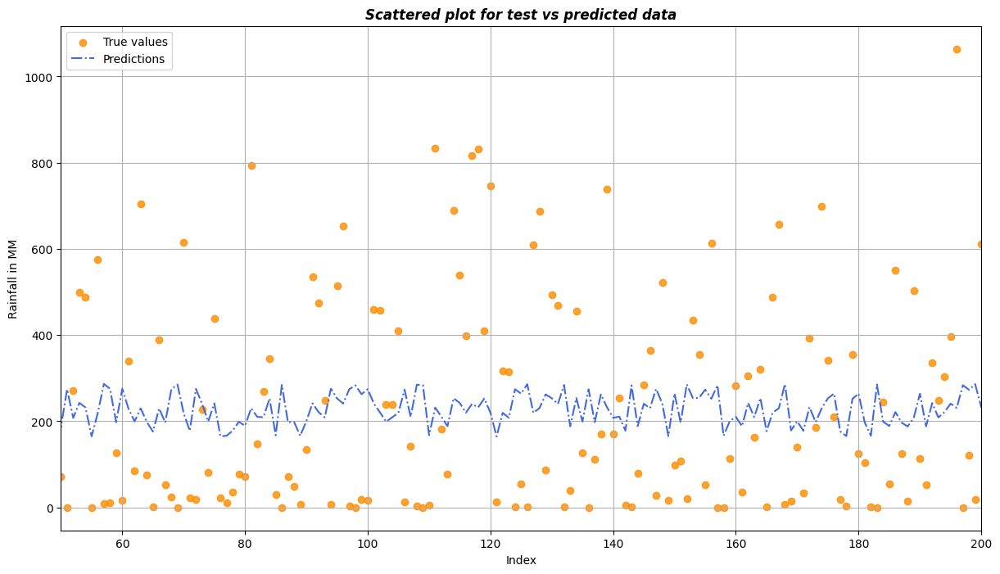

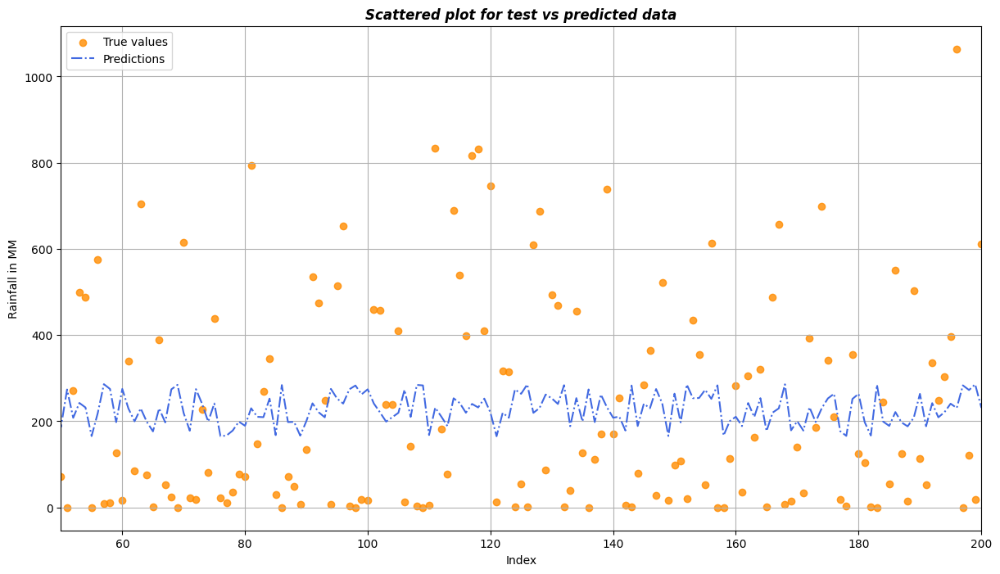

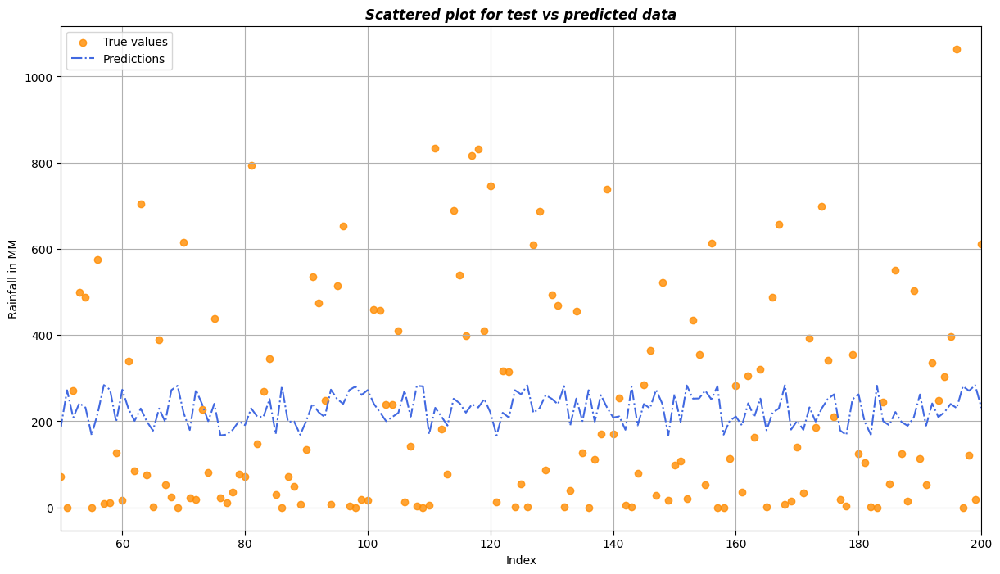

Ridge Regression MSE: 61521.14572580098
Lasso Regression MSE: 61517.1421955437
Elastic Net Regression MSE: 61501.68787679835


In [ ]:
# Ridge Regression

ridge = Ridge()
start=time.time()
ridge.fit(X_train, y_train)
end=time.time()
time_ridge=end-start
y_pred_ridge = ridge.predict(X_test)
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
#print(f'Ridge Regression MSE: {mse_ridge}')
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_pred_ridge , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()

# Lasso Regression

lasso = Lasso()
start=time.time()
lasso.fit(X_train, y_train)
end=time.time()
time_lasso=end-start
y_pred_lasso = lasso.predict(X_test)
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
r2_lasso = r2_score(y_test, y_pred_lasso)
#print(f'Lasso Regression MSE: {mse_lasso}')
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_pred_lasso , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


# Elastic Net Regression

elastic_net = ElasticNet()
start=time.time()
elastic_net.fit(X_train, y_train)
end=time.time()
time_enet=end-start
y_pred_enet = elastic_net.predict(X_test)
mse_enet = mean_squared_error(y_test, y_pred_enet)
mae_enet = mean_absolute_error(y_test, y_pred_enet)
r2_enet = r2_score(y_test, y_pred_enet)
#print(f'Elastic Net Regression MSE: {mse_enet}')
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_pred_enet , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()





# Calculate performance metrics for each of these

results = {
    'Ridge': mse_ridge,
    'Lasso': mse_lasso,
    'Elastic Net': mse_enet,
}

# Print the performance metrics

for model, mse in results.items():
    print(f'{model} Regression MSE: {mse}')


Still looks the same....

[ 0.079293   10.81134596]
Mean Squared Error (MSE): 61540.72071847788
----------------------------------------------------------------------
Mean Absolute Error (MAE): 210.09978484172356
----------------------------------------------------------------------
R-squared (R²): 0.0058982166510331835
----------------------------------------------------------------------


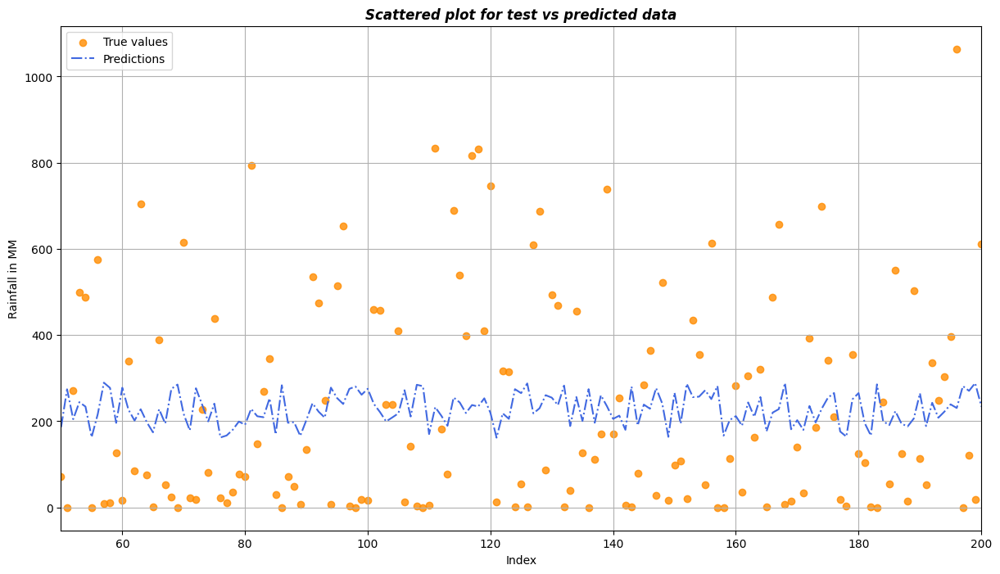

In [ ]:
# Define SVD equation. Inputs: X and y, Output: theta
def svd_equation(X, y):
    # Put your code and output accordingly
    U, S, Vt = np.linalg.svd(X, full_matrices=False)
    S_inv = np.diag(1 / S)

    theta = Vt.T @ S_inv @ U.T @ y
    return theta

# Use the SVD equation to find theta
theta_ne = svd_equation(X_train, y_train)
print(theta_ne)

# Predict using the SVD equation
#y_pred_ne =
#X_test_ne=np.hstack([np.ones((X_test.shape[0],1)),X_test])
y_pred_ne = X_test@( theta_ne)
#print(y_pred_ne)

# Calculate and print the performance metrics
mse = mean_squared_error(y_test, y_pred_ne)
mae = mean_absolute_error(y_test, y_pred_ne)
r2 = r2_score(y_test, y_pred_ne)
# Print the metrics
print("Mean Squared Error (MSE):", mse)
print("-"*70)
print("Mean Absolute Error (MAE):", mae)
print("-"*70)
print("R-squared (R²):", r2)
print("-"*70)
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_pred_ne , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()

At this point none of the above models improved the metrics to something usable, which means all of them failed to fit the data properly or underfitted the data....

### ❏ Random Forest Model

Applying random forest model...

In [ ]:
#importing necessary modules and functions
from sklearn.ensemble import RandomForestRegressor
#setting parameters and fitting
random_forest_model = RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)
random_forest_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)

In [ ]:
#predicting
y_train_predict=random_forest_model.predict(X_train)
y_test_predict=random_forest_model.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 67.25139753521515
MSE: 9957.431232574421
RMSE: 99.78692916697267

-------Train Data--------
MAE: 51.73516198501393
MSE: 6289.442034244097
RMSE: 79.30600251080682


In [ ]:
print("-----------Training Accuracy------------")
print(round(random_forest_model.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
89.7
-----------Testing Accuracy------------
83.89999999999999


We got a huge improvement this time, with the help of decision trees we gained an accuracy of 84 percent on the test data which means it fitted the data well and not overfitted ...

In [ ]:
predicted = random_forest_model.predict([[2014,2]])

In [ ]:
predicted

array([35.87949014])

In [ ]:
predicted = random_forest_model.predict([[2001,3]])

In [ ]:
predicted

array([64.49040958])

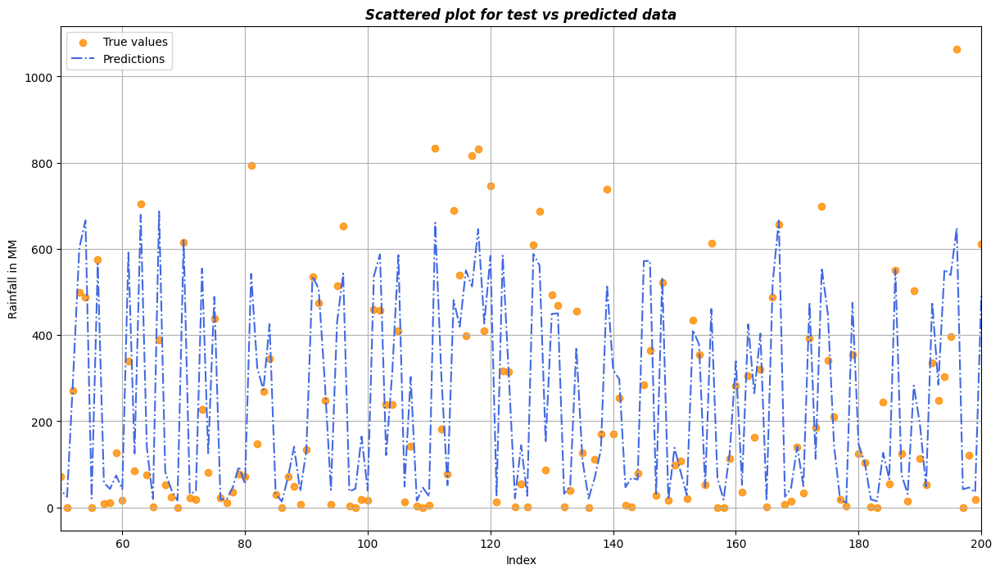

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


In [ ]:
random_forest_model1 = RandomForestRegressor(max_depth=200, max_features=2, min_samples_leaf=4,
                      min_samples_split=10, n_estimators=1000)
random_forest_model1.fit(X_train, y_train)
y_train_predict=random_forest_model1.predict(X_train)
y_test_predict=random_forest_model1.predict(X_test)
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))
print("-----------Training Accuracy------------")
print(round(random_forest_model1.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model1.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 64.13541007958425
MSE: 10397.477319976886
RMSE: 101.96802106531678

-------Train Data--------
MAE: 47.659129166590084
MSE: 5784.424846349893
RMSE: 76.0554064241977
-----------Training Accuracy------------
90.5
-----------Testing Accuracy------------
83.2


In [ ]:
random_forest_model2 = RandomForestRegressor(max_depth=100, max_features=1, min_samples_leaf=8,
                      min_samples_split=10, n_estimators=2000)
random_forest_model2.fit(X_train, y_train)
y_train_predict=random_forest_model2.predict(X_train)
y_test_predict=random_forest_model2.predict(X_test)
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))
print("-----------Training Accuracy------------")
print(round(random_forest_model2.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model2.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 68.97444463569614
MSE: 10140.866911374696
RMSE: 100.70187143928705

-------Train Data--------
MAE: 57.95377614591711
MSE: 7773.316296374577
RMSE: 88.16641251845613
-----------Training Accuracy------------
87.3
-----------Testing Accuracy------------
83.6


In [ ]:
random_forest_model3 = RandomForestRegressor(max_depth=100, max_features=2, min_samples_leaf=4,
                      min_samples_split=5, n_estimators=600)
random_forest_model3.fit(X_train, y_train)
y_train_predict=random_forest_model3.predict(X_train)
y_test_predict=random_forest_model3.predict(X_test)
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))
print("-----------Training Accuracy------------")
print(round(random_forest_model3.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model3.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 64.48275989777363
MSE: 10540.22827843325
RMSE: 102.66561390472104

-------Train Data--------
MAE: 47.10543127171962
MSE: 5675.43156160078
RMSE: 75.33546018709104
-----------Training Accuracy------------
90.7
-----------Testing Accuracy------------
83.0


In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [1000, 2000],
    'max_features': [ 2, 1],
    'max_depth': [100, 200],
    'min_samples_leaf': [4,8],
    'min_samples_split':[5,10]
}
grid_search = GridSearchCV(RandomForestRegressor(),
                           param_grid=param_grid)
grid_search.fit(X_train, y_train)
print(grid_search.best_estimator_)

RandomForestRegressor(max_depth=100, max_features=2, min_samples_leaf=8,
                      min_samples_split=5, n_estimators=2000)


In [ ]:
y_train_predict=grid_search.predict(X_train)
y_test_predict=grid_search.predict(X_test)
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))
print("-----------Training Accuracy------------")
print(round(random_forest_model3.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model3.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 63.47993525262014
MSE: 10133.364042551237
RMSE: 100.66461166940067

-------Train Data--------
MAE: 51.3699338776003
MSE: 6834.2743192955895
RMSE: 82.66966988742358
-----------Training Accuracy------------
90.7
-----------Testing Accuracy------------
83.0


### ❏ SVM

Though mainly used for classification based task it can be implemented in regression tasks also , let's see if it can do any better...

In [ ]:
##importing necessary modules and functions
from sklearn import svm
#defining model and fitting
svm_regr = svm.SVC(kernel='rbf')
svm_regr.fit(X_train, y_train)

SVC()

In [ ]:
#prediction
y_train_predict=svm_regr.predict(X_train)
y_test_predict=svm_regr.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 244.9855072463768
MSE: 121923.7536231884
RMSE: 349.1758205019191

-------Train Data--------
MAE: 224.88768115942028
MSE: 111577.11956521739
RMSE: 334.0316146193611


In [ ]:
print("-----------Training Accuracy------------")
print(round(svm_regr.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(svm_regr.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
5.5
-----------Testing Accuracy------------
5.800000000000001


Accuracy is too low in this case so it is of no use ...

### ❏ Logistic Regression

Implementing logistic regression...

In [ ]:
##importing necessary modules and functions
from sklearn.linear_model import LogisticRegression
# defining model and fitting
logreg = LogisticRegression(random_state=0,solver='lbfgs')
logreg.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [ ]:
#prediction
y_train_predict=logreg.predict(X_train)
y_test_predict=logreg.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 244.81521739130434
MSE: 121912.39492753622
RMSE: 349.1595551141859

-------Train Data--------
MAE: 224.94021739130434
MSE: 111563.45289855072
RMSE: 334.01115684741836


In [ ]:
print("-----------Training Accuracy------------")
print(round(logreg.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(logreg.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
4.3
-----------Testing Accuracy------------
4.0


Low accuracy on both training and test dataset denotes underfitting so it is of no use...

### ❏ xgboost

In [ ]:
#importing necessary modules and functions
from xgboost import XGBRegressor
# defining model and fitting
xgb = XGBRegressor()
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
#prediction
y_train_predict=xgb.predict(X_train)
y_test_predict=xgb.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 75.21815273779836
MSE: 14205.160761102561
RMSE: 119.18540498359084

-------Train Data--------
MAE: 21.639869613276012
MSE: 1070.3788158443904
RMSE: 32.716644324325046


In [ ]:
print("-----------Training Accuracy------------")
print(round(xgb.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(xgb.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
98.2
-----------Testing Accuracy------------
77.10000000000001


XGBoost fitted the training data extremely well. In case of test data it also did good but not as good as random forest...

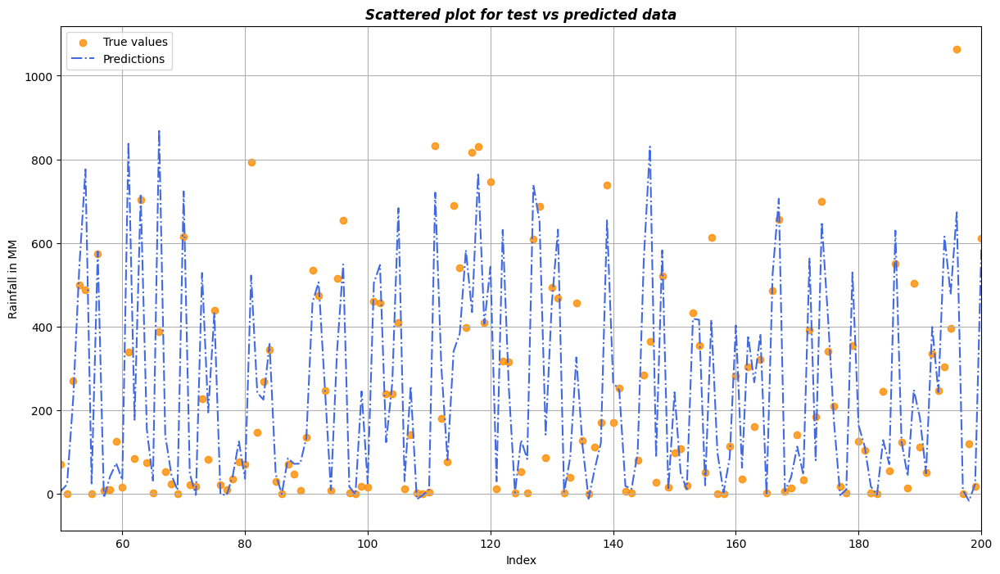

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


### ❏ Gradient Boosting Regressor

In [ ]:
#importing necessary modules and functions
from sklearn.ensemble import GradientBoostingRegressor
# defining model and fitting
gbr = GradientBoostingRegressor(random_state=0)
gbr.fit(X_train, y_train)

GradientBoostingRegressor(random_state=0)

In [ ]:
#prediction
y_train_predict=gbr.predict(X_train)
y_test_predict=gbr.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 62.90453396644773
MSE: 9584.480932996044
RMSE: 97.90036227203679

-------Train Data--------
MAE: 54.10309889193968
MSE: 7128.243649211818
RMSE: 84.4289266141162


In [ ]:
print("-----------Training Accuracy------------")
print(round(gbr.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(gbr.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
88.3
-----------Testing Accuracy------------
84.5


The best accuracy on the test data till now, in the category of individual model gradient boosting regressor predicted the best so it is our model of choice for this dataset...

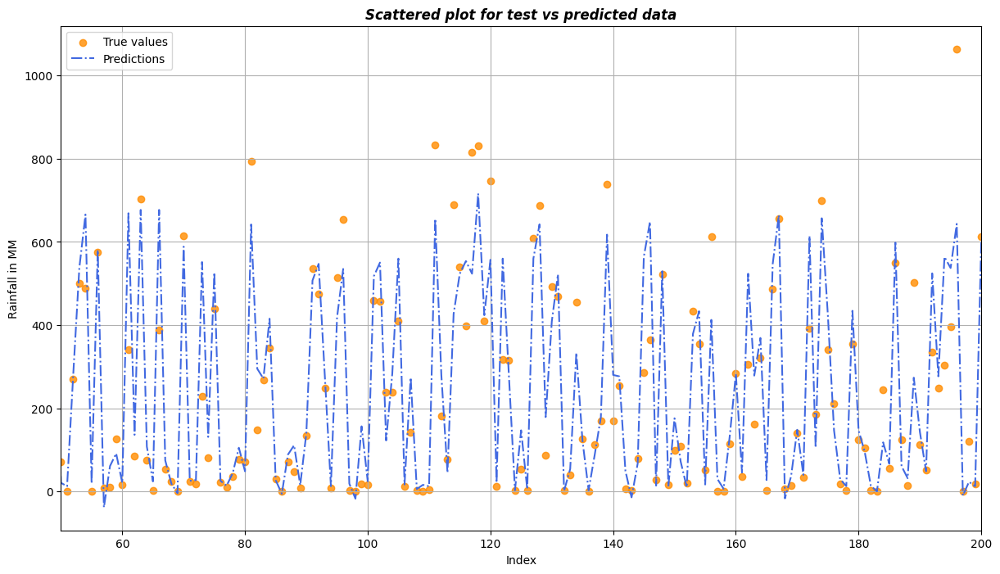

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


# Ensemble Stacking

Now let's try stacking the different models together, let's check if the accuracy can be further improved or not...

### ❏ Hybrid Model 1

The stacked model with meta learner = xgboost and the weak learners = Linear Regression, Random Forest and SVM

In [ ]:
#importing necessary modules and functions
from mlxtend.regressor import StackingCVRegressor

In [ ]:
# stacking model and fitting
stack = StackingCVRegressor(regressors=(LR, random_forest_model, svm_regr),
                            meta_regressor=xgb, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack.fit(X_train, y_train)

StackingCVRegressor(cv=12,
                    meta_regressor=XGBRegressor(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytree=None,
                                                device=None,
                                                early_stopping_rounds=None,
                                                enable_categorical=False,
                                                eval_metric=None,
                                                feature_types=None, gamma=None,
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learnin...
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=None, n_jobs=None,
                                                num_parallel_tree=None,
                                                random_state=None, ...),
                    random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                SVC()),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [ ]:
#prediction
y_train_predict=stack.predict(X_train)
y_test_predict=stack.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 68.29310440844384
MSE: 11761.70550513907
RMSE: 108.451396971819

-------Train Data--------
MAE: 54.65852104269805
MSE: 8125.535209940559
RMSE: 90.14175064830147


In [ ]:
print("-----------Training Accuracy------------")
print(round(stack.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
86.7
-----------Testing Accuracy------------
81.0


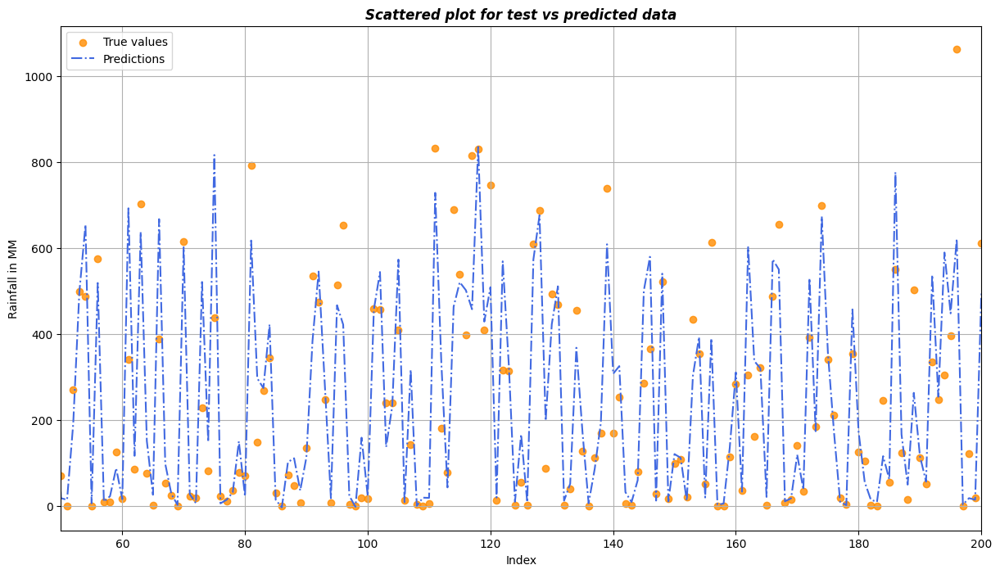

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


### ❏ Hybrid Model 2

The stacked model with meta learner = Linear Regression and the weak learners = Linear Regression, Random Forest and SVM

In [ ]:
# stacking model and fitting
stack2 = StackingCVRegressor(regressors=(LR, random_forest_model,svm_regr),
                            meta_regressor=LR, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack2.fit(X_train, y_train)

StackingCVRegressor(cv=12, meta_regressor=LinearRegression(), random_state=42,
                    regressors=(LinearRegression(),
                                RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                SVC()),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [ ]:
#prediction
y_train_predict=stack2.predict(X_train)
y_test_predict=stack2.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 65.95921429483398
MSE: 10236.136519031252
RMSE: 101.17379363763747

-------Train Data--------
MAE: 49.695106608946666
MSE: 6064.876895300292
RMSE: 77.87731951794625


In [ ]:
print("-----------Training Accuracy------------")
print(round(stack2.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack2.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
90.10000000000001
-----------Testing Accuracy------------
83.5


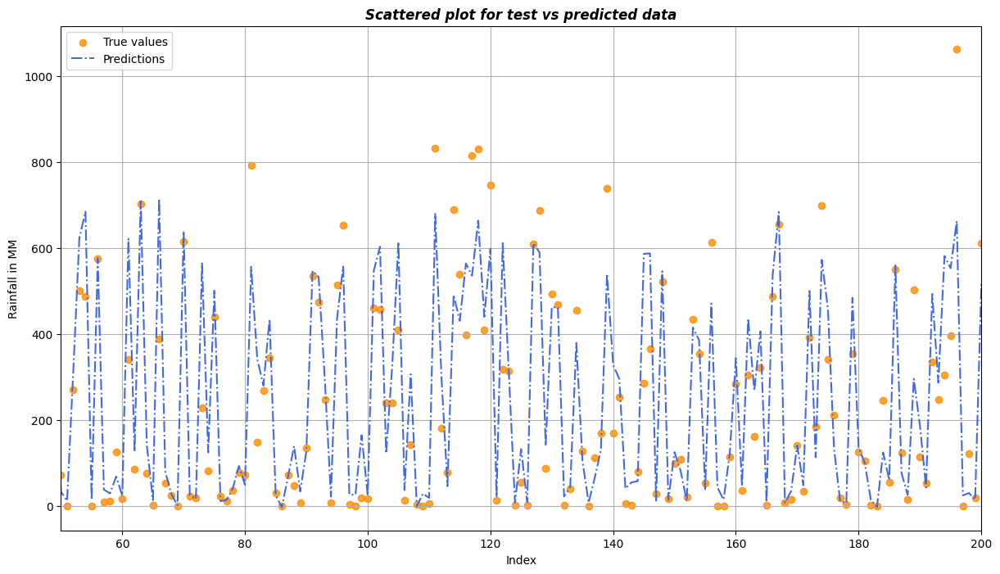

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


### ❏ Hybrid Model 3

The stacked model with meta learner = Logistic Regression and the weak learners = Linear Regression, Random Forest and SVM

In [ ]:
# stacking model and fitting
stack3 = StackingCVRegressor(regressors=(LR, svm_regr,logreg),
                            meta_regressor=LR, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack3.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

StackingCVRegressor(cv=12, meta_regressor=LinearRegression(), random_state=42,
                    regressors=(LinearRegression(), SVC(),
                                LogisticRegression(random_state=0)),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [ ]:
#prediction
y_train_predict=stack3.predict(X_train)
y_test_predict=stack3.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 202.29497177917418
MSE: 58226.80168182261
RMSE: 241.30230351536764

-------Train Data--------
MAE: 197.1151776193818
MSE: 56726.384279311875
RMSE: 238.17301333130055


In [ ]:
print("-----------Training Accuracy------------")
print(round(stack3.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack3.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
7.000000000000001
-----------Testing Accuracy------------
5.8999999999999995


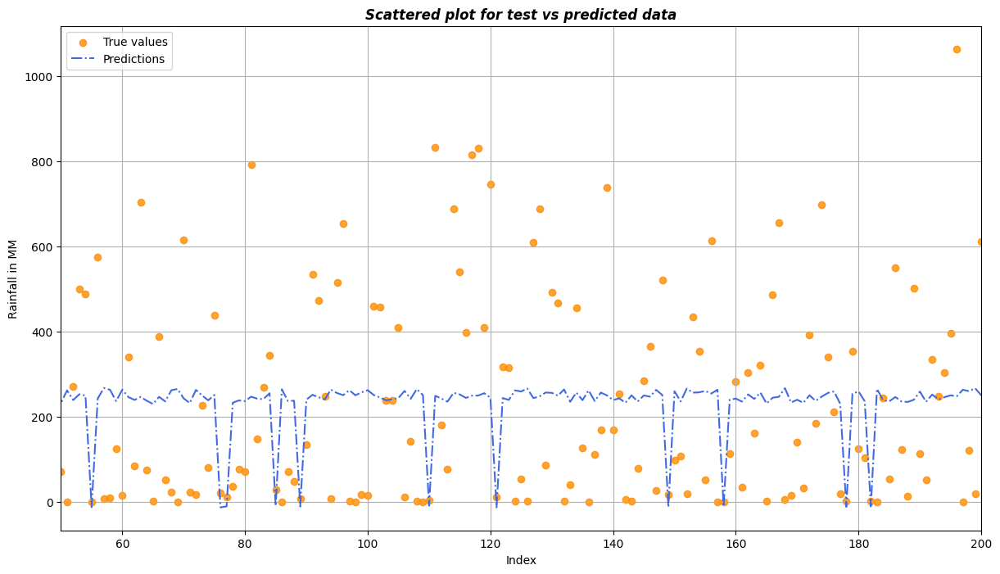

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


### ❏ Hybrid Model 4

In [ ]:
# stacking model and fitting
stack4 = StackingCVRegressor(regressors=(random_forest_model, gbr,xgb),
                            meta_regressor=gbr, cv=12,
                            use_features_in_secondary=True,
                            store_train_meta_features=True,
                            shuffle=False,
                            random_state=42)

stack4.fit(X_train, y_train)

StackingCVRegressor(cv=12,
                    meta_regressor=GradientBoostingRegressor(random_state=0),
                    random_state=42,
                    regressors=(RandomForestRegressor(max_depth=100,
                                                      max_features='sqrt',
                                                      min_samples_leaf=4,
                                                      min_samples_split=10,
                                                      n_estimators=800),
                                GradientBoostingRegressor(random_state=0),
                                XGBRegressor(base_score=None, booster=None,
                                             callbacks=None,
                                             colsample_bylevel=None,
                                             col...
                                             learning_rate=None, max_bin=None,
                                             max_cat_threshold=None,
                                             max_cat_to_onehot=None,
                                             max_delta_step=None,
                                             max_depth=None, max_leaves=None,
                                             min_child_weight=None, missing=nan,
                                             monotone_constraints=None,
                                             multi_strategy=None,
                                             n_estimators=None, n_jobs=None,
                                             num_parallel_tree=None,
                                             random_state=None, ...)),
                    shuffle=False, store_train_meta_features=True,
                    use_features_in_secondary=True)

In [ ]:
#prediction
y_train_predict=stack4.predict(X_train)
y_test_predict=stack4.predict(X_test)

In [ ]:
#printing the metrics
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 64.95536245617387
MSE: 10465.678448003262
RMSE: 102.3018985552236

-------Train Data--------
MAE: 56.08170320647095
MSE: 8672.656116709572
RMSE: 93.12709657618223


In [ ]:
print("-----------Training Accuracy------------")
print(round(stack4.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(stack4.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
85.8
-----------Testing Accuracy------------
83.1


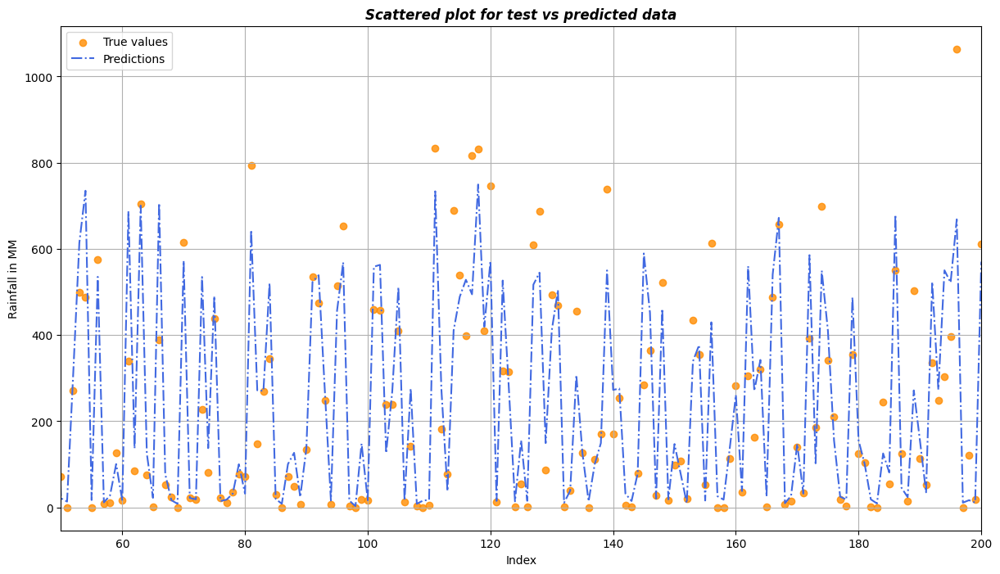

In [ ]:
x=range(0,len(y_test))
plt.figure(figsize=(14.5,8))
plt.scatter(x , y_test , color = 'darkorange' , label="True values", marker="o" , alpha=0.8)
#plt.scatter(x , y_test_predict , color = 'royalblue' , label="Predictions",marker="." , alpha=0.5)
plt.plot(x , y_test_predict , color = 'royalblue' , label="Predictions",linestyle='-.')
plt.xlim(50,200)
plt.title("Scattered plot for test vs predicted data" , fontsize='large',fontweight='bold',style='italic')
plt.xlabel("Index")
plt.ylabel("Rainfall in MM")
plt.grid(True)
plt.legend()
plt.show()


# Conclusion


Our aim is to fit the data well which means in such a volatile data of rainfall in west bengal we want to develop a model which performs well in predicting the rainfall by taking the year and month as input, as rainfall is a natural event depending upon a lot of factors and changes with time, it is almost impossible to predict the trend and find a pattern that will work forever. The best we can do is to predict the trend within a limited time period by analysing the immediate past dataset, in this project we have tried to implement different type of machine learning algorithms to find the best among them which describes the dataset most accurately which is gradient boosting regressor (accu=84.5%) in individual models and hybrid model 3 (accu=83.6%) in stacked models.   